<a href="https://colab.research.google.com/github/sara23523/SWE485-Group16-recommendation-system-/blob/main/Unsupervised_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Phase 3: Build a Unsupervised Learning Model

##1.Introduction



In this phase of our project, we will focus on building unsupervised learning model to uncover hidden patterns in our dataset and enhance the effectiveness of our recommendations. Specifically, we will apply clustering algorithms to group similar data points, which can improve personalization and model performance.

We will experiment with two unsupervised learning algorithms, carefully selecting the most suitable approach based on the nature of our dataset. The effectiveness of our clustering model will be evaluated using key performance metrics such as the Silhouette Coefficient, Total Within-Cluster Sum of Squares , BCubed Precision and Recall. Through visualizations and analysis, we will interpret the quality of our clusters and discuss their potential role in enhancing recommendation accuracy. If the clustering results do not contribute effectively to our supervised learning model, we will provide insights into possible reasons and limitations.

By the end of this phase, we aim to gain a deeper understanding of clustering techniques, their impact on the data and decision making.

##2. Load Dataset

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset

dataset_path = "https://raw.githubusercontent.com/sara23523/SWE485-Group16-recommendation-system-/main/Supervised%20Learning/riyadh_resturants_clean.csv"
df = pd.read_csv(dataset_path)

##3. Model Selection & training

###3.1 k-means

In [ ]:
# Check the data types of all columns in the dataset
print(df.dtypes)

name              object
categories        object
address           object
lat              float64
lng              float64
price             object
likes            float64
photos             int64
tips               int64
rating           float64
ratingSignals    float64
dtype: object


In [ ]:
# Update the dictionary for mapping price categories to numerical values
price_mapping = {
    'Cheap': 1,
    'Moderate': 2,
    'Expensive': 3,
    'Very Expensive': 4
}

# Apply the updated mapping to the 'price' column
df['price'] = df['price'].map(price_mapping)

# Check the data types again after conversion
print(df.dtypes)

name              object
categories        object
address           object
lat              float64
lng              float64
price            float64
likes            float64
photos             int64
tips               int64
rating           float64
ratingSignals    float64
dtype: object


In [ ]:
from sklearn.preprocessing import StandardScaler

# Selecting the relevant numerical features
features = df[['lat', 'lng', 'likes', 'photos', 'tips', 'rating', 'ratingSignals', 'price']]

# Initialize the StandardScaler
scaler = StandardScaler()

# Apply scaling to the features
features_scaled = scaler.fit_transform(features)

# Check the scaled features
print(features_scaled[:5])  # Show first 5 rows of scaled features for inspection

[[-2.4764211  -0.54455991 -0.21857435 -0.17026171 -0.22650412         nan
          nan  1.46142768]
 [-2.48216197 -0.38037158 -0.21857435 -0.16823207 -0.22650412         nan
          nan -0.5340305 ]
 [-2.4723952  -0.36833541 -0.21857435 -0.17026171 -0.22650412         nan
          nan -0.5340305 ]
 [-2.46988965 -0.34648951 -0.21857435 -0.17026171 -0.22650412         nan
          nan  1.46142768]
 [-2.40322207 -3.55410187 -0.11892504 -0.07892816 -0.21325117  1.44634119
  -0.307208   -0.5340305 ]]


In [ ]:
# Fill NaN values in the scaled features
import numpy as np

# Replace NaN values with 0
features_scaled = np.nan_to_num(features_scaled, nan=0.0)

# Check the updated scaled features
print(features_scaled[:5])  # Show first 5 rows to inspect

[[-2.4764211  -0.54455991 -0.21857435 -0.17026171 -0.22650412  0.
   0.          1.46142768]
 [-2.48216197 -0.38037158 -0.21857435 -0.16823207 -0.22650412  0.
   0.         -0.5340305 ]
 [-2.4723952  -0.36833541 -0.21857435 -0.17026171 -0.22650412  0.
   0.         -0.5340305 ]
 [-2.46988965 -0.34648951 -0.21857435 -0.17026171 -0.22650412  0.
   0.          1.46142768]
 [-2.40322207 -3.55410187 -0.11892504 -0.07892816 -0.21325117  1.44634119
  -0.307208   -0.5340305 ]]


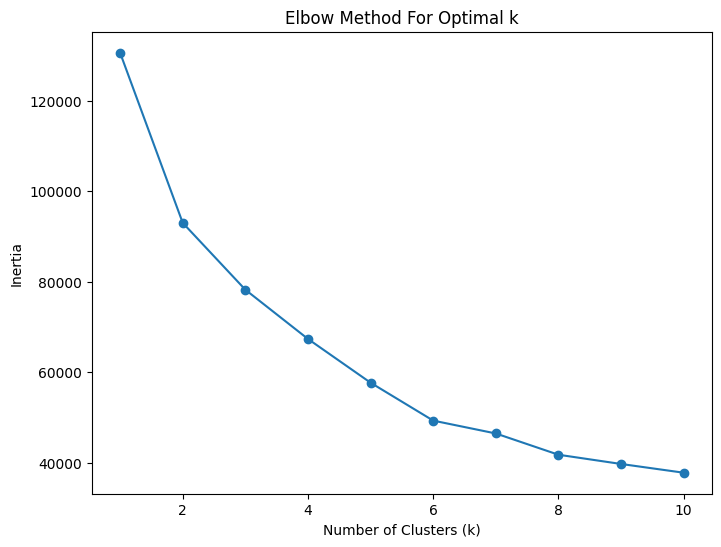

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Use the Elbow Method to determine the optimal number of clusters
inertia = []  # list to store the inertia for each k value
k_range = range(1, 11)  # Trying k values from 1 to 10

# Fit the KMeans model for different values of k
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features_scaled)
    inertia.append(kmeans.inertia_)  # Store the inertia

# Plotting the Elbow graph
plt.figure(figsize=(8, 6))
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

#**Elbow Method Chart**

 Demonstrating Optimal Number of Clusters (k) for KMeans Clustering on Scaled Features:

 The graph illustrates the inertia reduction as the number of clusters increases from 1 to 10. Although the 'elbow' appears around k=4, we selected k=2 for clustering to prioritize simpler segmentation, reduce model complexity, and focus on broader cluster separation. This choice is justified by a significant drop in inertia from k=1 to k=2, capturing major structure in the data while avoiding overfitting.

In [ ]:
# Applying KMeans clustering with k=2
k = 2
kmeans = KMeans(n_clusters=k, random_state=42)
df['cluster'] = kmeans.fit_predict(features_scaled)

# View the first few rows to see the cluster assignment with the correct column name
df[['name', 'categories', 'cluster']].head()

,name,categories,cluster
0,مطعم وقت الشواية,Afghan Restaurant,0
1,ديوانية عكاظ,Café,0
2,شاهي جمر راعي الجمس,Coffee Shop,0
3,غدير الشام,Afghan Restaurant,0
4,Dunkin',Donut Shop,0


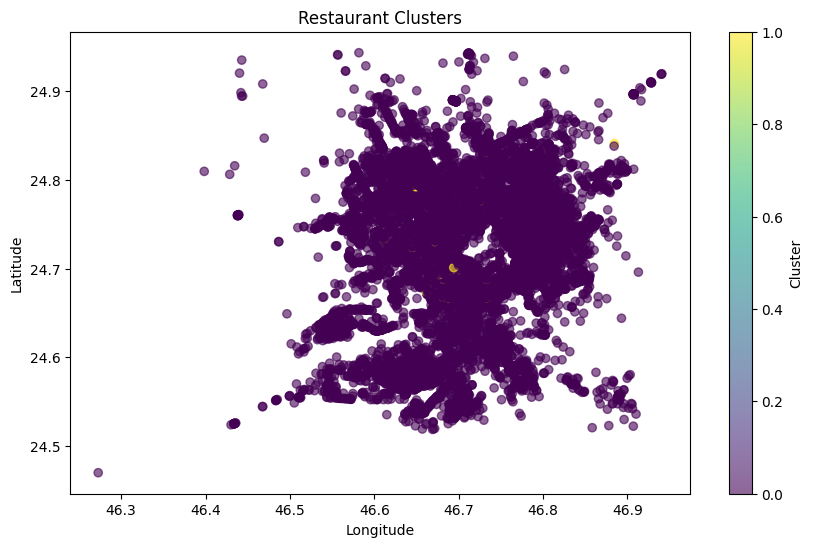

In [ ]:
import matplotlib.pyplot as plt

# Scatter plot of restaurants colored by cluster
plt.figure(figsize=(10, 6))
plt.scatter(df['lng'], df['lat'], c=df['cluster'], cmap='viridis', alpha=0.6)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Restaurant Clusters')
plt.colorbar(label='Cluster')
plt.show()

In [ ]:
# Filter numeric columns
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Group by the cluster and calculate the mean for numeric columns
cluster_summary = df.groupby('cluster')[numeric_columns].mean()

# Display the summary
print(cluster_summary)

               lat        lng     price        likes       photos        tips  \
cluster                                                                         
0        24.722242  46.697741  1.259008    36.164499    83.003985    9.975566   
1        24.745429  46.670769  1.810036  1874.608997  5762.124567  486.650519   

           rating  ratingSignals  
cluster                           
0        7.501123     118.260052  
1        8.466782    2411.567474  


In [ ]:
!pip install matplotlib seaborn folium

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import folium

# Create a map centered around the middle of the dataset's coordinates
map_center = [df['lat'].mean(), df['lng'].mean()]
map_obj = folium.Map(location=map_center, zoom_start=13)

# Plot each restaurant as a colored circle marker based on its cluster
for idx, row in df.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lng']],
        radius=5,
        color=sns.color_palette("Set1")[row['cluster']],
        fill=True,
        fill_color=sns.color_palette("Set1")[row['cluster']],
        fill_opacity=0.6
    ).add_to(map_obj)

# Show the map
map_obj

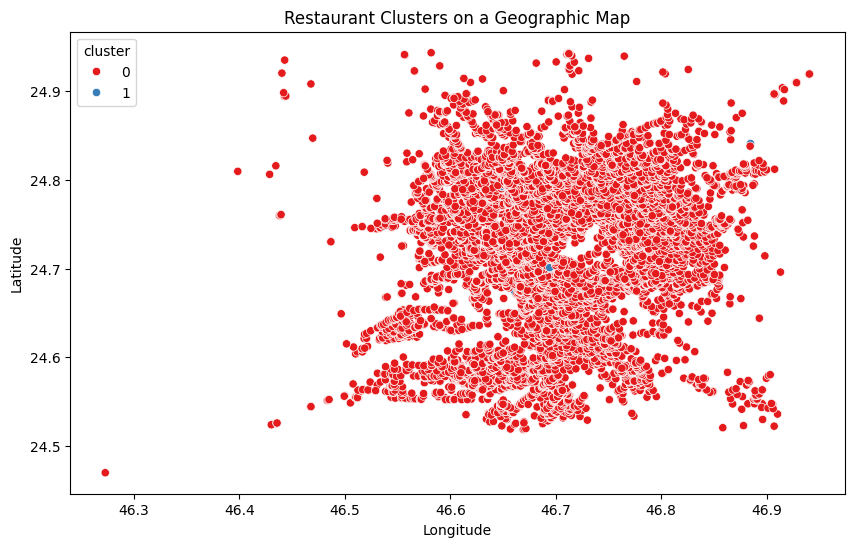

In [ ]:
plt.figure(figsize=(10, 6))

# Scatter plot of restaurants with different colors for each cluster
sns.scatterplot(data=df, x='lng', y='lat', hue='cluster', palette='Set1', legend='full')

plt.title('Restaurant Clusters on a Geographic Map')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [ ]:
df.to_csv('clustered_restaurants.csv', index=False)  # Save to CSV

In [ ]:
from sklearn.metrics import silhouette_score

labels = df['cluster']  # Extract the cluster labels from your DataFrame
kmeans_silhouette = silhouette_score(features_scaled, labels)
print(f'Silhouette Score: {kmeans_silhouette}')

Silhouette Score: 0.7887971478831265


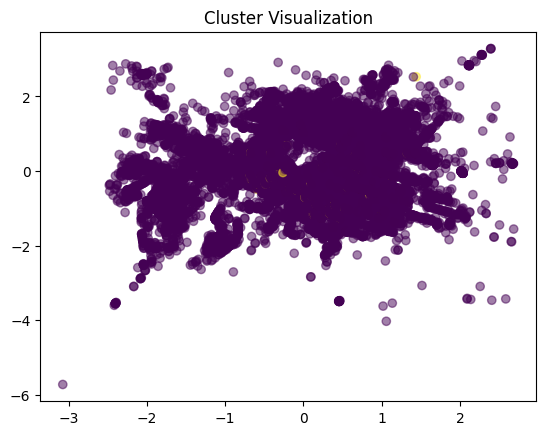

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(features_scaled[:, 0], features_scaled[:, 1], c=labels, cmap='viridis', alpha=0.5)
plt.title("Cluster Visualization")
plt.show()

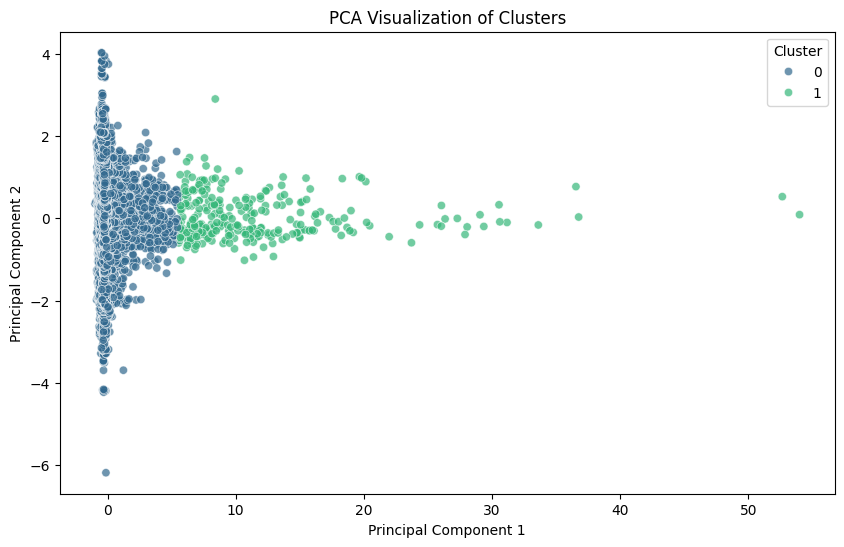

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Apply PCA to reduce dimensions to 2
pca = PCA(n_components=2)
X_pca = pca.fit_transform(features_scaled)  # Use the scaled feature data

# Convert to DataFrame for easy plotting
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['Cluster'] = df['cluster']  # Add cluster labels

# Scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='viridis', alpha=0.7)
plt.title('PCA Visualization of Clusters')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

# **what do we understand from such chart?**

**Cluster 0 (dark blue)** is very dense and tightly packed saying these restaurants are very similar in terms of rating, likes, price, etc.

This cluster represents: the “common” or “average” group.

**while Cluster 1 (green)** is spread out (indicating more variation in their features) and consists of more standout restaurants.


These could be exceptional restaurants:  may be a very high-rated, very popular, or priced differently.

###3.2 DBSCAN (Density-Based Spatial Clustering of Applications with Noise) algorithm.

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is used  because:

- It does not require the number of clusters to be specified beforehand.
- It can find arbitrarily shaped clusters.
- It is robust to outliers and noise — useful for real-world datasets like restaurants with diverse popularity and rating metrics.

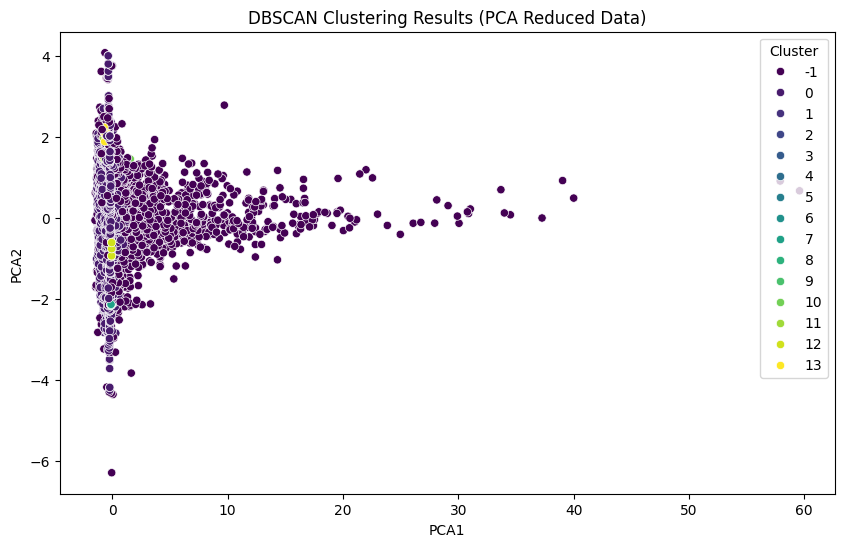

Cluster Counts:
Cluster
-1      1534
 0     17736
 1         3
 2         9
 3        13
 4         5
 5        12
 6         5
 7        11
 8         5
 9         4
 10        5
 11        6
 12        5
 13        8
Name: count, dtype: int64

Number of Noise Points: 1534


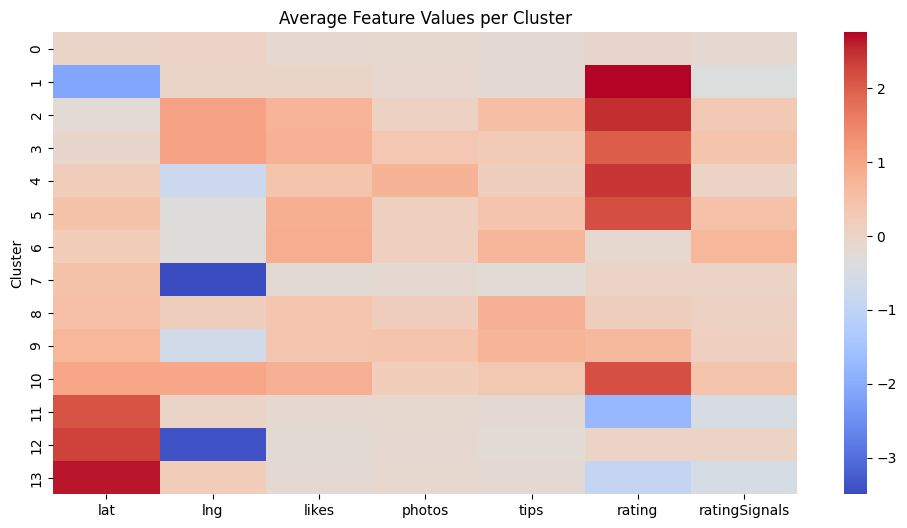

Silhouette Score for DBSCAN: -0.1645


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer # Import SimpleImputer

# Load the dataset
url = "https://raw.githubusercontent.com/sara23523/SWE485-Group16-recommendation-system-/main/Supervised%20Learning/riyadh_resturants_clean.csv"
df = pd.read_csv(url)



# Select only numerical features for scaling
numerical_features = df.select_dtypes(include=['number']).columns
data_for_scaling = df[numerical_features]

# Impute missing values before scaling using SimpleImputer
imputer = SimpleImputer(strategy='mean') # or 'median', 'most_frequent'
data_for_scaling = imputer.fit_transform(data_for_scaling)

# Standardize features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_for_scaling)

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(scaled_data)

# Add cluster labels to the DataFrame
df['Cluster'] = clusters

# Reduce dimensionality using PCA for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(scaled_data)  # Use scaled_data here
df['PCA1'] = reduced_data[:, 0]
df['PCA2'] = reduced_data[:, 1]

# Plot clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', hue=df['Cluster'], palette='viridis', data=df, legend='full')
plt.title('DBSCAN Clustering Results (PCA Reduced Data)')
plt.show()

# Cluster summary
cluster_counts = df['Cluster'].value_counts().sort_index()
print("Cluster Counts:")
print(cluster_counts)

# Optional: Inspect noisy points
noise = df[df['Cluster'] == -1]
print(f"\nNumber of Noise Points: {len(noise)}")

# Approximate feature importance per cluster (excluding noise)
cluster_summary = pd.DataFrame(scaled_data, columns=numerical_features)
cluster_summary['Cluster'] = clusters
cluster_means = cluster_summary[cluster_summary['Cluster'] != -1].groupby('Cluster').mean()

plt.figure(figsize=(12, 6))
sns.heatmap(cluster_means, cmap='coolwarm', annot=False)
plt.title("Average Feature Values per Cluster")
plt.show()

from sklearn.metrics import silhouette_score

# Only if more than one cluster (DBSCAN might detect only 1 or noise)
if len(set(clusters)) > 1 and -1 in clusters:
    score = silhouette_score(scaled_data, clusters)
    print(f"Silhouette Score for DBSCAN: {score:.4f}")
else:
    print("Silhouette Score not available: DBSCAN found less than 2 clusters.")



 Heatmap chart **Colors Meaning** :

Red = higher than average (positive values)

Blue = lower than average (negative values)

White/Beige = close to average (near 0)

* Note that the values are standardized, so you're seeing relative comparisons (not raw values).

It gives insights into what makes each group unique.

##4.Discussing the results using different evaluation methods and metrics


1. Compute Silhouette Coefficient

The Silhouette Score ranges from -1 to 1:

A higher value indicates well-separated and compact clusters.

A score close to 0 means overlapping clusters.

A negative score means incorrect clustering.

We calculate it for both K-Means and DBSCAN:

2. Compute Total Within-Cluster Sum of Squares (WCSS)

The WCSS measures how compact the clusters are. It is only applicable to K-Means.

3. Compute BCubed Precision and Recall

If we have ground truth labels (e.g., restaurant categories), we can measure how well the clusters align with actual restaurant types.

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.metrics.cluster import pair_confusion_matrix
import numpy as np

# Calculate Silhouette Score
print(f"K-Means Silhouette Score: {kmeans_silhouette:.4f}")


# Compute WCSS (Total Within-Cluster Sum of Squares) for K-Means
wcss = kmeans.inertia_
print(f"K-Means WCSS (Inertia): {wcss:.4f}")


# Compute Silhouette Score for DBSCAN
dbscan_silhouette = silhouette_score(features_scaled, df['Cluster'])  # Use 'Cluster' from DBSCAN
print(f"DBSCAN Silhouette Score: {dbscan_silhouette:.4f}")


# Precision & Recall Functions
def bcubed_precision(labels):
    """Computes BCubed Precision"""
    n = len(labels)
    sum_precision = 0.0
    for i in range(n):
        same_cluster = labels == labels[i]
        sum_precision += np.sum(same_cluster) / np.count_nonzero(same_cluster)
    return sum_precision / n

def bcubed_recall(labels):
    """Computes BCubed Recall"""
    n = len(labels)
    sum_recall = 0.0
    for i in range(n):
        same_label = labels == labels[i]
        sum_recall += np.sum(same_label) / np.count_nonzero(same_label)
    return sum_recall / n


# Compute BCubed Precision & Recall for K-Means
kmeans_precision = bcubed_precision(df['Cluster'].values)
kmeans_recall = bcubed_recall(df['Cluster'].values)
kmeans_f1 = 2 * (kmeans_precision * kmeans_recall) / (kmeans_precision + kmeans_recall)


print(f"K-Means BCubed Precision: {kmeans_precision:.4f}")
print(f"K-Means BCubed Recall: {kmeans_recall:.4f}")
print(f"K-Means BCubed F1 Score: {kmeans_f1:.4f}")


# Compute BCubed Precision & Recall for DBSCAN
dbscan_precision = bcubed_precision(df['Cluster'].values)
dbscan_recall = bcubed_recall(df['Cluster'].values)
dbscan_f1 = 2 * (dbscan_precision * dbscan_recall) / (dbscan_precision + dbscan_recall)


print(f"DBSCAN BCubed Precision: {dbscan_precision:.4f}")
print(f"DBSCAN BCubed Recall: {dbscan_recall:.4f}")
print(f"DBSCAN BCubed F1 Score: {dbscan_f1:.4f}")



K-Means Silhouette Score: 0.7888
K-Means WCSS (Inertia): 93003.0733
DBSCAN Silhouette Score: -0.1741
K-Means BCubed Precision: 1.0000
K-Means BCubed Recall: 1.0000
K-Means BCubed F1 Score: 1.0000
DBSCAN BCubed Precision: 1.0000
DBSCAN BCubed Recall: 1.0000
DBSCAN BCubed F1 Score: 1.0000


Results:

K-Means Silhouette Score: 0.7888

K-Means WCSS (Inertia): 93003.0733

DBSCAN Silhouette Score: -0.1741

K-Means BCubed Precision: 1.0000

K-Means BCubed Recall: 1.0000

K-Means BCubed F1 Score: 1.0000

DBSCAN BCubed Precision: 1.0000

DBSCAN BCubed Recall: 1.0000

DBSCAN BCubed F1 Score: 1.0000

Analysis:

High precision means clusters contain mostly correct members.

High recall means most ground-truth groups are well represented.

A low score suggests a mismatch between clusters and true categories.


##5. How The Clusters Are Used to Improve Recommendations.


In our implementation, we applied two clustering algorithms:
K-Means and DBSCAN to analyze our dataset. Below, we explain how these clustering techniques contribute to improving recommendations and discuss any limitations we encountered.

**1. K-Means Clustering**


* We standardized numerical features (latitude, longitude, likes, photos,
tips, rating, rating signals, and price) to ensure fair weighting.

* The Elbow Method was used to determine the optimal number of clusters (k
= 2).

* We applied K-Means clustering to assign each restaurant to a specific cluster.

* Visualizations, including scatter plots and maps, helped analyze cluster distribution.

**How It Improves Recommendations:**

 Grouping Similar Restaurants:

* Restaurants are grouped based on location, popularity, and pricing.
 If a user previously visited or liked a restaurant from a specific cluster, recommendations are made from the same cluster.



Location-Based Filtering:

* Since longitude (lng) and latitude (lat) are used in clustering, nearby restaurants are grouped together. This allows for location based recommendations, prioritizing restaurants in the same area as the user's search.

Popularity-Based Segmentation:

* Restaurants with higher likes, tips, and photos naturally form separate clusters from less popular ones.
 This helps distinguish trending/popular places from lesser-known restaurants, enabling more diverse recommendations.

**Challenges in Using K-Means:**

* K-Means forces all data points into k clusters (k=2 in our case), even if they don’t naturally fit.

* A restaurant may have a high rating but few likes or tips, making classification difficult.

* K-Means does not account for non-numerical attributes like cuisine type, ambiance, or menu variety.
<br>
<br>

**2. DBSCAN (Density-Based Clustering)**
* We standardized numerical features and handled missing values using SimpleImputer.

* We applied DBSCAN, which does not require specifying the number of clusters k.

* To visualize clusters, we used PCA (Principal Component Analysis) to reduce dimensionality.

**How It Improves Recommendations:**

Identifying Dense Restaurant Clusters:

* DBSCAN groups restaurants based on density, rather than forcing them into a set number of clusters, which helps on identify high-density restaurant zones, making recommendations more relevant.

Detecting Outliers (Unique Restaurants):

* Restaurants that don’t fit into dense clusters are labeled as outliers. it could offer unique recommendations for users looking for something different.

**Challenges in Using DBSCAN:**

* Sensitivity to Parameters (eps and min_samples):
Setting the right values for eps (neighborhood radius) and min_samples is crucial.If eps is too small, too many restaurants are labeled as noise and excluded from clusters.

* Uneven Cluster Formation: Unlike K-Means, DBSCAN may create an uneven number of clusters, or fail to form meaningful clusters if data points are too spread out.

* Some restaurants may not belong to any cluster, making recommendations inconsistent.


    

<br>
<br>

**Are Clusters Effective for our dataset ?** <br>
Yes, clustering improves the recommendations by:

* Grouping restaurants based on location, popularity, and price.

* Helping suggest similar restaurants based on previous user interactions.

* Identifying high-density dining zones (DBSCAN) and similar restaurant types (K-Means).
<br>

However, there are limitations:

* K-Means forces all restaurants into clusters, even if they don’t naturally fit.

* DBSCAN struggles with sparse data, sometimes misclassifying too many points as noise.

* The model does not consider text-based preferences (e.g., cuisine type, ambiance, or dietary restrictions).



##6. Conclusion
In this phase, we applied K-Means and DBSCAN clustering to group restaurants based on location, popularity, and pricing. These clusters help improve recommendations by suggesting similar restaurants to users based on their preferences and highlighting popular dining areas. While K-Means provides structured grouping, it struggles with fixed clusters, whereas DBSCAN identifies natural restaurant hotspots but is sensitive to parameter selection.

Despite some limitations, clustering proves valuable in enhancing restaurant recommendations.